<a href="https://colab.research.google.com/github/katearb/ipynb-projects/blob/master/Fruit_Dataset_classification_EDA%2BDP%2BLR_KNN_RF_LGBM_Automl_Test_accuracy_0_91.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# get data
!wget https://www.muratkoklu.com/datasets/vtdhnd06.php
!unzip /content/vtdhnd06.php

In [ ]:
# install packages
!pip install dash
!pip install --upgrade plotly
!pip install statsmodels
!pip install flaml

In [ ]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
import pandas as pd
import numpy as np

In [4]:
data = pd.read_excel('/content/Date_Fruit_Datasets/Date_Fruit_Datasets.xlsx')

In [ ]:
# first look
data.head()

,AREA,PERIMETER,MAJOR_AXIS,MINOR_AXIS,ECCENTRICITY,EQDIASQ,SOLIDITY,CONVEX_AREA,EXTENT,ASPECT_RATIO,...,KurtosisRR,KurtosisRG,KurtosisRB,EntropyRR,EntropyRG,EntropyRB,ALLdaub4RR,ALLdaub4RG,ALLdaub4RB,Class
0,422163,2378.908,837.8484,645.6693,0.6373,733.1539,0.9947,424428,0.7831,1.2976,...,3.2370,2.9574,4.2287,-59191263232,-50714214400,-39922372608,58.7255,54.9554,47.8400,BERHI
1,338136,2085.144,723.8198,595.2073,0.5690,656.1464,0.9974,339014,0.7795,1.2161,...,2.6228,2.6350,3.1704,-34233065472,-37462601728,-31477794816,50.0259,52.8168,47.8315,BERHI
2,526843,2647.394,940.7379,715.3638,0.6494,819.0222,0.9962,528876,0.7657,1.3150,...,3.7516,3.8611,4.7192,-93948354560,-74738221056,-60311207936,65.4772,59.2860,51.9378,BERHI
3,416063,2351.210,827.9804,645.2988,0.6266,727.8378,0.9948,418255,0.7759,1.2831,...,5.0401,8.6136,8.2618,-32074307584,-32060925952,-29575010304,43.3900,44.1259,41.1882,BERHI
4,347562,2160.354,763.9877,582.8359,0.6465,665.2291,0.9908,350797,0.7569,1.3108,...,2.7016,2.9761,4.4146,-39980974080,-35980042240,-25593278464,52.7743,50.9080,42.6666,BERHI


In [ ]:
# shape
data.shape

(898, 35)

898 samples & 35 features

In [ ]:
# data types
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 898 entries, 0 to 897
Data columns (total 35 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   AREA           898 non-null    int64  
 1   PERIMETER      898 non-null    float64
 2   MAJOR_AXIS     898 non-null    float64
 3   MINOR_AXIS     898 non-null    float64
 4   ECCENTRICITY   898 non-null    float64
 5   EQDIASQ        898 non-null    float64
 6   SOLIDITY       898 non-null    float64
 7   CONVEX_AREA    898 non-null    int64  
 8   EXTENT         898 non-null    float64
 9   ASPECT_RATIO   898 non-null    float64
 10  ROUNDNESS      898 non-null    float64
 11  COMPACTNESS    898 non-null    float64
 12  SHAPEFACTOR_1  898 non-null    float64
 13  SHAPEFACTOR_2  898 non-null    float64
 14  SHAPEFACTOR_3  898 non-null    float64
 15  SHAPEFACTOR_4  898 non-null    float64
 16  MeanRR         898 non-null    float64
 17  MeanRG         898 non-null    float64
 18  MeanRB    

All features are numeric, target is categorical.

In [5]:
classes = data['Class'].unique()

# EDA

In [ ]:
import plotly.figure_factory as ff
import plotly.express as px

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import FunctionTransformer, MinMaxScaler
from scipy.stats import boxcox
from scipy import stats
from imblearn.over_sampling import SMOTE
from sklearn.base import BaseEstimator, TransformerMixin
from scipy.stats import boxcox, shapiro

import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels.api as sm
from statsmodels.formula.api import ols

## Univariate analysis

### distribution of features

In [5]:
def draw_distribution(feature, column):
  bin_size =  (max(feature) - min(feature)) / 100
  fig = px.histogram(feature, marginal="box")
  
  fig.update_layout(autosize=True, width=1200, height=500,
                    title_text=column)
  fig.show()

In [ ]:
for column in data.columns[:-1]:
  draw_distribution(data[column].to_numpy(), column)

Quick notes on observations:

- Non of the features are normal distributed. However, some of them are distributred normal-wise: bell-shaped, unimodal, symmetric.
- Some normal-wise distributions experience outliers: extreme values on one or both sides.
- Some features are exponentially distributed.
- Scale is very different from feature to feature.
- Some fatures contain outliers, which derivate from the majority of the observations very far across big gaps.

Distinctive characteristics of some particular features:
- acpect ration has low variability: 897 samples has this feature equal to 0.
- same for shapefactor_1
- All Kurtosis* have exponential distribution and very long tails which make boxplots irrelevant to analyse. However, we can notice some extreme values on the ends of the tails across gaps in values which can be considered as outliers.

## Target EDA

In [6]:
target = data['Class'].value_counts()

In [ ]:
fig = px.pie(values=target.values, names=target.index, title='Classes proportion')
fig.update_layout(autosize=True, width=800, height=500)
fig.show()

Three out of seven classes are responsible for 63.4% of all the data. The largest class conaines 22.7% of the samples, the smallest -- only 7.24% which is 3 times less.

Some imbalance in the data is observed, however it is not critical. Nonetheless, some oversampling technique could be implemented to improve the final result.

## Features with respect to target.

In [ ]:
def draw_distribution(features, column, labels=classes, alpha=0.05):
  bin_sizes =  [(max(f) - min(f)) / 100 for f in features]
  norm_tests = [shapiro(f)[1] for f in features]
  labels_text = [f'{c}(normal, p={round(p, 6)})' if p > alpha else f'{c}(not normal, p={round(p, 6)})' for c, p in zip(classes, norm_tests)]

  fig = ff.create_distplot(features, labels_text, 
                           bin_size=bin_sizes)
  
  fig.update_layout(autosize=True, width=1250, height=500,
                    title_text=column)
  fig.show()

In [ ]:
for column in data.columns[:-1]:
  feature_split = [data[column][target == t_class] for t_class in classes]
  draw_distribution(feature_split, column)

From visual perspective, distributions of some features hue to diffrenet classes differ from each other clearly (e.g. area) but for other features the difference for classes is not observed. I intend to perform ANOVA test to identify usefull independent variables which show different distributions for different classes.
If distribution of a features is the same for every class than it is not helpfull for future predictions, so we can eliminate it.

ANOVA assumptions: we have already explored features' distributions and established that most of them do not meet some ANOVA requirements.
1. Normal distribution
2. No outliers
3. Variance is equal in groups.

Moreover, target analysis showed that there is disbalance in classes so the samples are od different sizes.

So, it is reqired to perform:
1. Data normalization
2. Upsampling
3. Outliers detection and removal.

In [8]:
target = data['Class']
data_eda = data.drop(['SHAPEFACTOR_1', 'ASPECT_RATIO', 'Class'], axis=1)

In [10]:
TARGET_MAP = {t: i for i, t in enumerate(target.unique())}
INVERSE_TARGET_MAP = {v:k for k,v in TARGET_MAP.items()}

class ANOVATransformer(BaseEstimator, TransformerMixin):
  def __init__(self, classes):
    self.classes = [TARGET_MAP[c] for c in classes]
    self.scaler = MinMaxScaler()

  def _devide_x_into_groups(self, x, y):
    x = [[x[col][y==t_class] for t_class in self.classes] for col in x]
    y = [[y[y==t_class] for t_class in self.classes] for col in x]
    return x, y

  def _remove_outliers(self, x, y):
    new_x = x.copy()
    new_y = y.copy()
    for i, f in enumerate(x):
      for k, group in enumerate(f):
        new_x[i][k] = group[(np.abs(stats.zscore(group)) < 3)]
        new_y[i][k] = y[i][k][(np.abs(stats.zscore(group)) < 3)]

    return new_x, new_y

  def _normalize_distribution(self, x):
    new_x = x.copy()
    for i, f in enumerate(x):
      for k, group in enumerate(f):
        group_norm = self.scaler.fit_transform(np.array(group).reshape(-1, 1))
        group_norm = [x[0]+1 for x in group_norm]
        x[i][k] = self.scaler.fit_transform(boxcox(group_norm, -1).reshape(-1, 1))
        x[i][k] = [x[0] for x in x[i][k]]
    return x


  def transform(self, x, y):
    y = pd.Series([*map(lambda x: TARGET_MAP[x], y)])
    self.features = x.columns
    x, y = self._devide_x_into_groups(x, y)

    x, y = self._remove_outliers(x, y)
    x = self._normalize_distribution(x)

    return x, y

In [ ]:
t = ANOVATransformer(classes)
x, y = t.transform(data_eda, target)

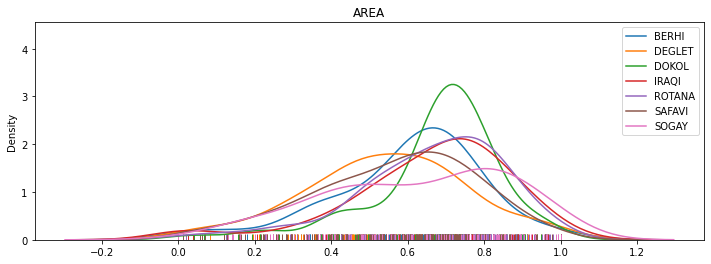

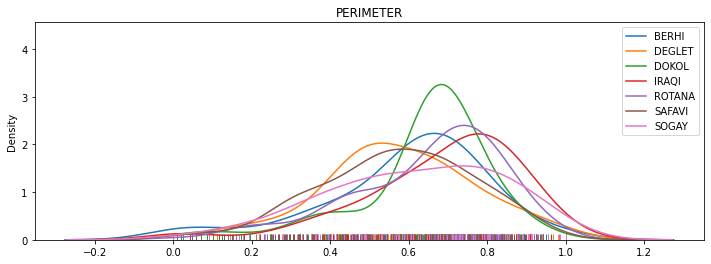

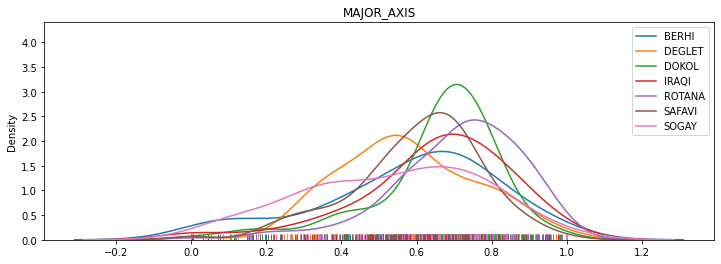

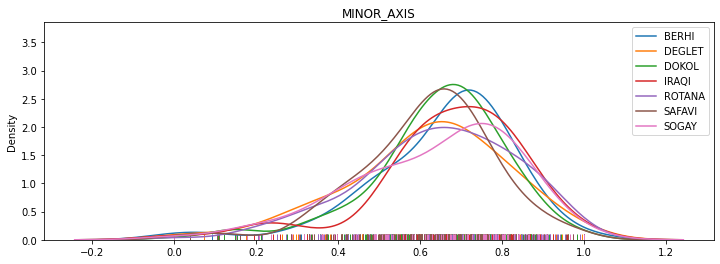

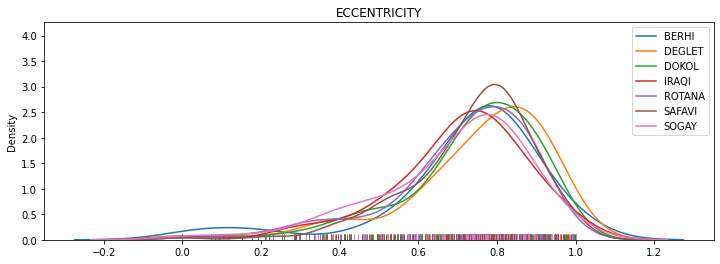

...

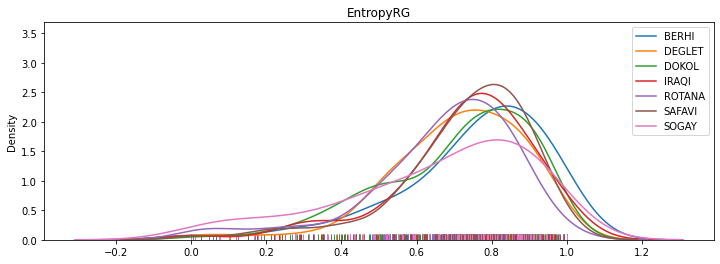

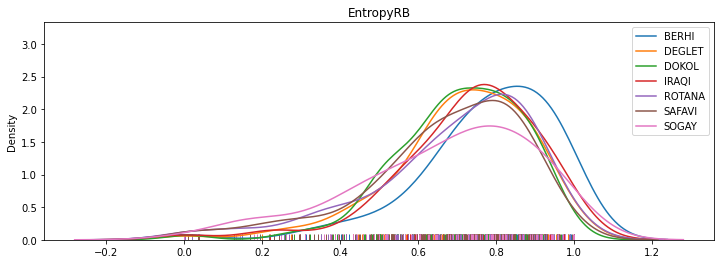

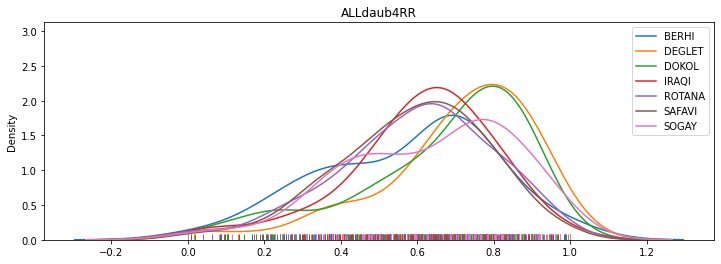

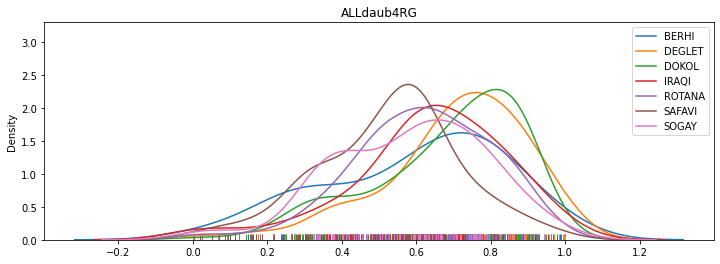

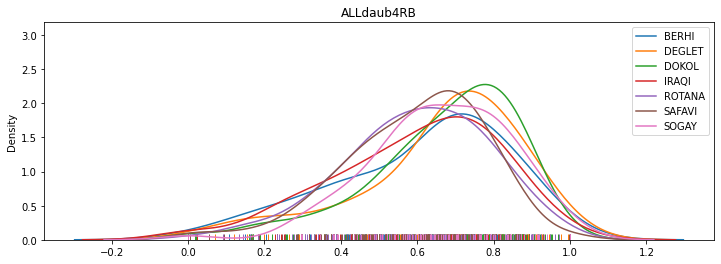

In [ ]:
for i, feature in enumerate(x):
  plt.figure(figsize=(12, 4))
  for group in feature:
    sns.distplot(group, hist=False, rug=True)
  plt.title(f'{t.features[i]}')  
  plt.legend([INVERSE_TARGET_MAP[c] for c in t.classes])
  plt.show()

In [ ]:
for i, feature in enumerate(x):
  F, p = stats.f_oneway(*feature)
  p = round(p, 5)
  if p < 0.01:
    print(f'+++ {t.features[i]}: p={p} --> reject H0, samples means are not equal')
  else:
    print(f'--- {t.features[i]}: p={p} --> fail to reject H0, samples means are equal')

+++ AREA: p=0.0 --> reject H0, samples means are not equal
+++ PERIMETER: p=1e-05 --> reject H0, samples means are not equal
+++ MAJOR_AXIS: p=0.0 --> reject H0, samples means are not equal
--- MINOR_AXIS: p=0.29052 --> fail to reject H0, samples means are equal
--- ECCENTRICITY: p=0.13508 --> fail to reject H0, samples means are equal
+++ EQDIASQ: p=6e-05 --> reject H0, samples means are not equal
+++ SOLIDITY: p=0.0 --> reject H0, samples means are not equal
+++ CONVEX_AREA: p=0.0 --> reject H0, samples means are not equal
+++ EXTENT: p=0.0 --> reject H0, samples means are not equal
+++ ROUNDNESS: p=0.0 --> reject H0, samples means are not equal
+++ COMPACTNESS: p=0.0 --> reject H0, samples means are not equal
+++ SHAPEFACTOR_2: p=0.0 --> reject H0, samples means are not equal
+++ SHAPEFACTOR_3: p=7e-05 --> reject H0, samples means are not equal
+++ SHAPEFACTOR_4: p=0.0 --> reject H0, samples means are not equal
+++ MeanRR: p=1e-05 --> reject H0, samples means are not equal
+++ MeanR

Features that failed to reject H0 wont be included in the final dataset.

## Correlation

Correlation must be explored to avoid multicollinarity in the dataset.

It is important because if there are features correlated with each other, it might cause instability in model.

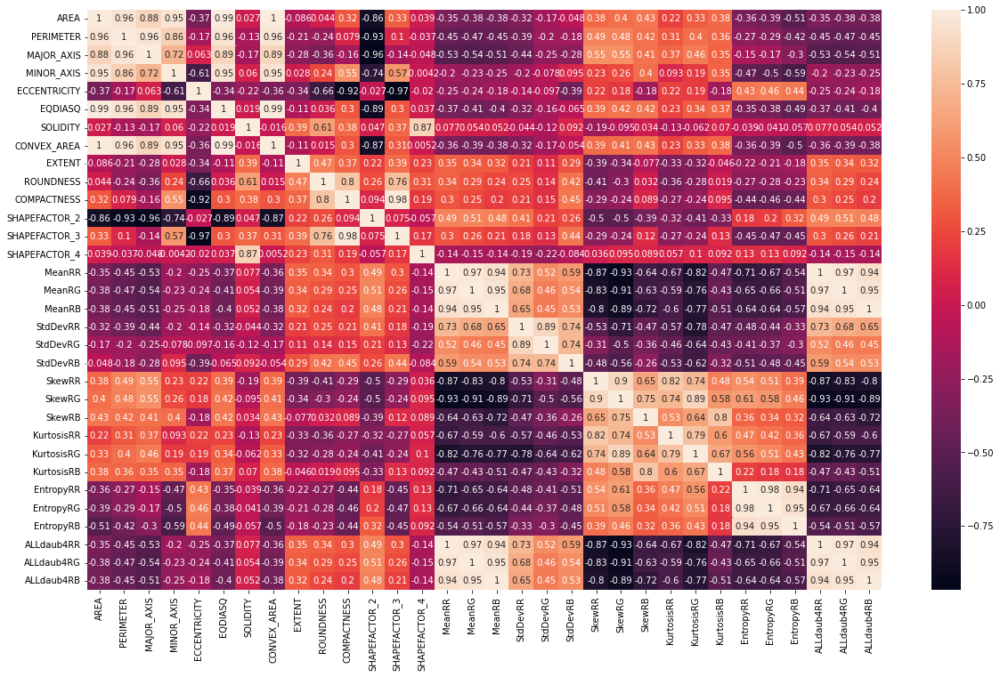

In [ ]:
corr_data = data.drop(['SHAPEFACTOR_1', 'ASPECT_RATIO'], axis=1).corr()
plt.figure(figsize=(20, 12))
sns.heatmap(corr_data, annot=True)

Multicollinearity is very high in the dataset. Some features are correlated with the coefficient equal to 1 (e.g. area and convex area)


Possible ways to deal with it:
1. Delete one of correlated features
2. Combine them
3. Implement DR
4. Use regularization in model.

Conclusion:
1. Features are not normal-distributed --> Normalization required
2. Features are of different scales --> Scaling required
3.  Disbalance in classes --> Resampling reqired
4. Some features do not influence target distribution --> Feature removal required
5. Multicollinearity observed --> Feature removal required
6. No missing values observed
7. Outliers observed --> Outliers removal required

Features are considered to be deleted because of multicolliearity: CONVEX_AREA, MINOR_AXIS, PERIMETER, EQDIASQ, SHAPEFACTOR_2, SHAPEFACTOR_3, MeanRR, MeanRG, StdDevRR, SkewRR, SkewRG, KurtosisRR, KurtosisRG, EntropyRR, EntropyRG, ALLdaub4RR, ALLdaub4RG

+ ECCENTRICITY, StdDevRB (ANOVA)

# Data Preprocessing

In [ ]:
from imblearn.pipeline import make_pipeline, Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import PowerTransformer

In [13]:
normalizer = PowerTransformer(method='box-cox')
scaler = MinMaxScaler(feature_range=(1, 2))
outlier_removal = FunctionTransformer(lambda x : x[(np.abs(stats.zscore(x)) < 3)])
over_sampler = SMOTE(random_state=0)
prepr_pipe = Pipeline([
                 ('scaler', scaler), 
                 ('normalizer', normalizer),
                 ('resampler', over_sampler)
                ])

test_pipe = Pipeline([
                 ('scaler', scaler), 
                 ('normalizer', normalizer)
                ])

# Models fitting

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import roc_auc_score, accuracy_score, classification_report

from sklearn.linear_model import LogisticRegression
from scipy.stats import uniform, randint
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

In [14]:
def train_cv(model, X_train, y_train, params, n_splits=10):
  kf = KFold(n_splits=n_splits, random_state=0, shuffle=True)

  cv = RandomizedSearchCV(model,
                        params,
                        cv=kf,
                        scoring='roc_auc',
                        return_train_score=True,
                        n_jobs=-1,
                        verbose=True,
                        random_state=1
                        )
  cv.fit(X_train, y_train)

  print('Best params', cv.best_params_)
  return cv

## with features removal

In [13]:
X = data.drop(['CONVEX_AREA', 'MINOR_AXIS', 'MAJOR_AXIS', 'PERIMETER', 'EQDIASQ', 'SHAPEFACTOR_2',
               'SHAPEFACTOR_3', 'MeanRR', 'MeanRG', 'StdDevRR', 'SkewRR', 'SkewRG', 
               'KurtosisRR', 'KurtosisRG', 'EntropyRR', 'EntropyRG', 'ALLdaub4RR', 'ALLdaub4RB',
               'ALLdaub4RG', 'ECCENTRICITY', 'StdDevRB', 'SHAPEFACTOR_1', 'ASPECT_RATIO', 'Class'], axis=1)
y = data['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [ ]:
X.shape, y.shape

((898, 32), (898,))

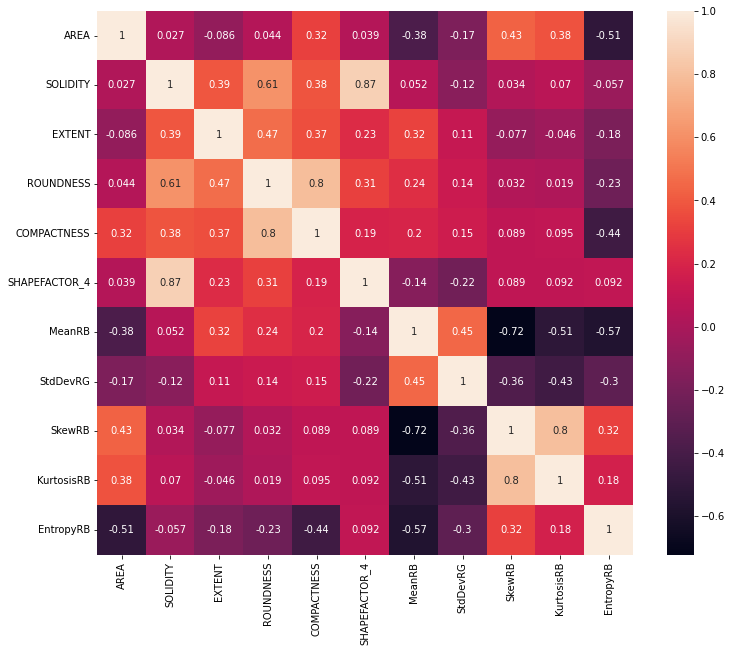

In [ ]:
plt.figure(figsize=(12, 10))
sns.heatmap(X.corr(), annot=True)
plt.show()

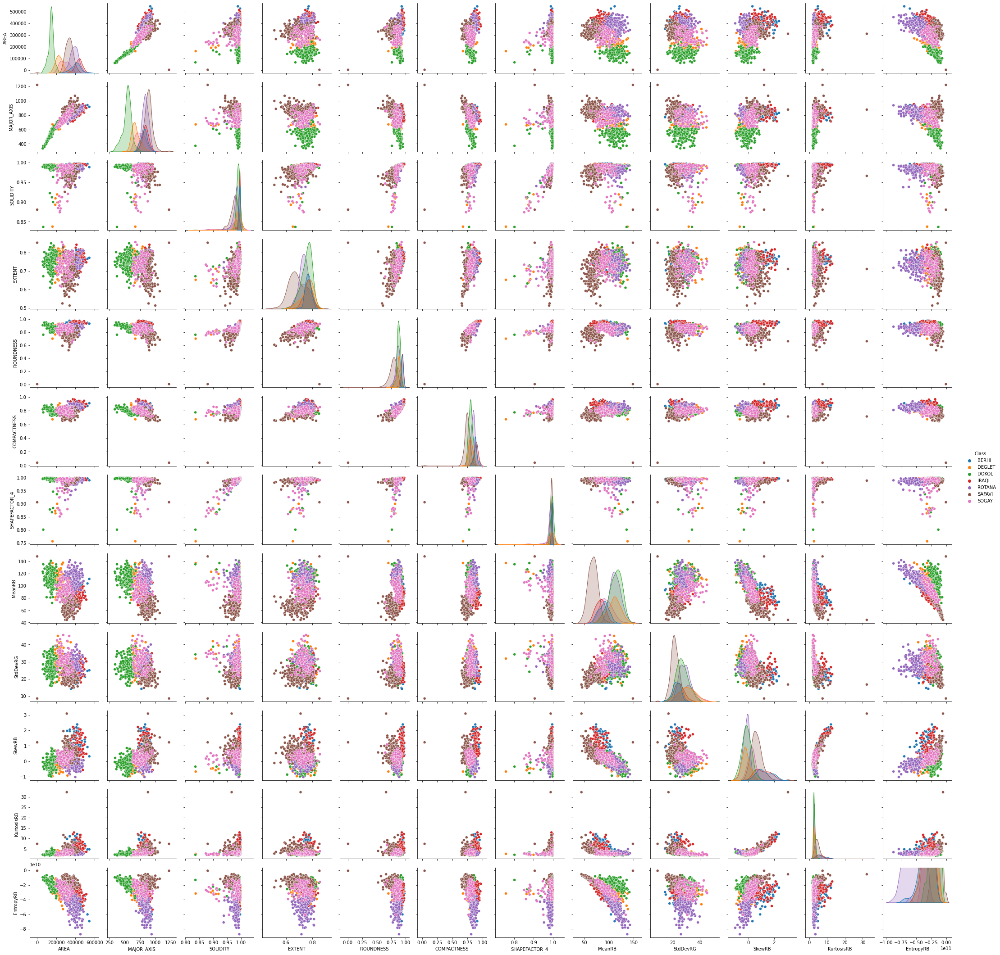

In [ ]:
sns.pairplot(X, hue='Class')

In [ ]:
X_train, y_train = prepr_pipe.fit_resample(X_train, y_train)
X_test = test_pipe.fit_transform(X_test, y_test)

In [ ]:
rs_parameters = {
    'penalty': ['l2', 'l1', 'elasticnet'],
    'C': uniform(scale=10),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'saga'],
    'l1_ratio': uniform(scale=10)
    }
lr = LogisticRegression()
model_cv_lr = train_cv(lr, X_train, y_train, rs_parameters)

bestimator_lr = model_cv_lr.best_estimator_

In [ ]:
ypred = bestimator_lr.predict(X_test)
ypred_proba = bestimator_lr.predict_proba(X_test)

In [ ]:
print(roc_auc_score(y_test, ypred_proba, multi_class='ovr'))
print(classification_report(y_test, ypred))

              precision    recall  f1-score   support

       BERHI       0.88      0.82      0.85        17
      DEGLET       0.50      0.89      0.64        18
       DOKOL       0.95      0.77      0.85        53
       IRAQI       0.85      0.85      0.85        20
      ROTANA       0.95      0.97      0.96        38
      SAFAVI       0.96      0.96      0.96        53
       SOGAY       0.86      0.73      0.79        26

    accuracy                           0.87       225
   macro avg       0.85      0.86      0.84       225
weighted avg       0.89      0.87      0.87       225



## KNN

In [ ]:
kf = KFold(n_splits=10, random_state=0, shuffle=True)
rs_parameters = {
    'n_neighbors': randint(10, 20),
    'weights': ['uniform', 'distance'],
    'leaf_size': randint(2, 10)
    }

knn = KNeighborsClassifier(n_jobs=-1)

model_cv_knn = train_cv(knn, X_train, y_train, rs_parameters)
bestimator_knn = model_cv_knn.best_estimator_

In [ ]:
ypred = bestimator_knn.predict(X_test)
ypred_proba = bestimator_knn.predict_proba(X_test)

In [ ]:
print(roc_auc_score(y_test, ypred_proba, multi_class='ovr'))
print(classification_report(y_test, ypred))

              precision    recall  f1-score   support

       BERHI       0.63      0.71      0.67        17
      DEGLET       0.45      0.78      0.57        18
       DOKOL       0.95      0.74      0.83        53
       IRAQI       0.71      0.60      0.65        20
      ROTANA       0.97      0.95      0.96        38
      SAFAVI       0.93      0.96      0.94        53
       SOGAY       0.80      0.77      0.78        26

    accuracy                           0.82       225
   macro avg       0.78      0.79      0.77       225
weighted avg       0.85      0.82      0.82       225



## Without features removal

In [ ]:
X = data.drop(['SHAPEFACTOR_1', 'ASPECT_RATIO', 'Class'], axis=1)
y = data['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    random_state=0)

In [ ]:
X_train, y_train = prepr_pipe.fit_resample(X_train, y_train)
X_test = test_pipe.fit_transform(X_test, y_test)

In [ ]:
rs_parameters = {
    'penalty': ['l2', 'l1', 'elasticnet'],
    'C': uniform(scale=10),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'saga'],
    'l1_ratio': uniform(scale=10)
    }
lr = LogisticRegression()
model_cv_lr = train_cv(lr, X_train, y_train, rs_parameters)

bestimator_lr = model_cv_lr.best_estimator_

In [ ]:
ypred = bestimator_lr.predict(X_test)
ypred_proba = bestimator_lr.predict_proba(X_test)

In [ ]:
print(accuracy_score(y_test, ypred))
roc_auc_score(y_test, ypred_proba, multi_class='ovr')

0.8933333333333333


0.9870520008934249

In [ ]:
print(classification_report(y_test, ypred))

              precision    recall  f1-score   support

       BERHI       1.00      0.88      0.94        17
      DEGLET       0.53      0.89      0.67        18
       DOKOL       0.96      0.83      0.89        53
       IRAQI       0.90      0.95      0.93        20
      ROTANA       0.93      0.97      0.95        38
      SAFAVI       0.98      0.96      0.97        53
       SOGAY       0.90      0.73      0.81        26

    accuracy                           0.89       225
   macro avg       0.89      0.89      0.88       225
weighted avg       0.92      0.89      0.90       225



In [ ]:
kf = KFold(n_splits=10, random_state=0, shuffle=True)
rs_parameters = {
    'n_neighbors': randint(10, 20),
    'weights': ['uniform', 'distance'],
    'leaf_size': randint(2, 10)
    }

knn = KNeighborsClassifier(n_jobs=-1)

model_cv_knn = train_cv(knn, X_train, y_train, rs_parameters)
bestimator_knn = model_cv_knn.best_estimator_

In [ ]:
ypred = bestimator_knn.predict(X_test)
ypred_proba = bestimator_knn.predict_proba(X_test)

In [ ]:
print(roc_auc_score(y_test, ypred_proba, multi_class='ovr'))
print(classification_report(y_test, ypred))

              precision    recall  f1-score   support

       BERHI       0.76      0.94      0.84        17
      DEGLET       0.50      0.78      0.61        18
       DOKOL       0.96      0.83      0.89        53
       IRAQI       0.94      0.75      0.83        20
      ROTANA       0.97      0.92      0.95        38
      SAFAVI       0.96      0.98      0.97        53
       SOGAY       0.79      0.73      0.76        26

    accuracy                           0.87       225
   macro avg       0.84      0.85      0.84       225
weighted avg       0.89      0.87      0.87       225



## with DR

In [ ]:
from imblearn.pipeline import make_pipeline, Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import PowerTransformer
from sklearn.decomposition import PCA

In [15]:
normalizer = PowerTransformer(method='box-cox')
scaler = MinMaxScaler(feature_range=(2, 3))
outlier_removal = FunctionTransformer(lambda x : x[(np.abs(stats.zscore(x)) < 3)])
over_sampler = SMOTE(random_state=0)
pca = PCA(n_components=16)

prepr_pipe = Pipeline([
                 ('scaler', scaler), 
                 ('normalizer', normalizer),
                 ('DR', pca),
                ])

In [16]:
X = data.drop(['Class'], axis=1)
y = data['Class']

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0)

In [17]:
X_train, y_train = over_sampler.fit_resample(X_train, y_train)
X_train = prepr_pipe.fit_transform(X_train)

X_test = prepr_pipe.transform(X_test)

### Logistic Regression

In [ ]:
rs_parameters = {
    'penalty': ['l2', 'l1', 'elasticnet'],
    'C': uniform(scale=10),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'saga'],
    'l1_ratio': uniform(scale=10)
    }
    
lr = LogisticRegression()
model_cv_lr = train_cv(lr, X_train, y_train, rs_parameters)

bestimator_lr = model_cv_lr.best_estimator_

In [ ]:
ypred = bestimator_lr.predict(X_test)
ypred_proba = bestimator_lr.predict_proba(X_test)

In [ ]:
print(roc_auc_score(y_test, ypred_proba, multi_class='ovr'))
print(classification_report(y_test, ypred))

              precision    recall  f1-score   support

       BERHI       0.88      0.88      0.88        17
      DEGLET       0.61      0.78      0.68        18
       DOKOL       0.94      0.92      0.93        53
       IRAQI       0.90      0.90      0.90        20
      ROTANA       0.92      0.95      0.94        38
      SAFAVI       0.96      0.94      0.95        53
       SOGAY       0.82      0.69      0.75        26

    accuracy                           0.89       225
   macro avg       0.86      0.87      0.86       225
weighted avg       0.89      0.89      0.89       225



### KNN

In [ ]:
kf = KFold(n_splits=10, random_state=0, shuffle=True)
rs_parameters = {
    'n_neighbors': randint(10, 20),
    'weights': ['uniform', 'distance'],
    'leaf_size': randint(2, 10)
    }

knn = KNeighborsClassifier(n_jobs=-1)

model_cv_knn = train_cv(knn, X_train, y_train, rs_parameters)
bestimator_knn = model_cv_knn.best_estimator_

In [ ]:
ypred = bestimator_knn.predict(X_test)
ypred_proba = bestimator_knn.predict_proba(X_test)

In [ ]:
print(roc_auc_score(y_test, ypred_proba, multi_class='ovr'))
print(classification_report(y_test, ypred))

              precision    recall  f1-score   support

       BERHI       0.94      0.94      0.94        17
      DEGLET       0.64      0.78      0.70        18
       DOKOL       0.96      0.89      0.92        53
       IRAQI       0.95      0.95      0.95        20
      ROTANA       0.97      0.92      0.95        38
      SAFAVI       0.96      0.98      0.97        53
       SOGAY       0.81      0.85      0.83        26

    accuracy                           0.91       225
   macro avg       0.89      0.90      0.89       225
weighted avg       0.92      0.91      0.91       225



### Random Forest

In [ ]:
kf = KFold(n_splits=10, random_state=0, shuffle=True)
rs_parameters = {
    'n_estimators': randint(10, 100),
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth': randint(2, 20),
    'min_samples_split': randint(2, 5),
    'min_samples_leaf': [1, 2, 3],

    }

rf = RandomForestClassifier(random_state=0, n_jobs=-1)

model_cv_rf = train_cv(rf, X_train, y_train, rs_parameters)
bestimator_rf = model_cv_knn.best_estimator_

In [ ]:
ypred = bestimator_rf.predict(X_test)
ypred_proba = bestimator_rf.predict_proba(X_test)

In [ ]:
print(roc_auc_score(y_test, ypred_proba, multi_class='ovr'))
print(classification_report(y_test, ypred))

              precision    recall  f1-score   support

       BERHI       0.88      0.82      0.85        17
      DEGLET       0.68      0.72      0.70        18
       DOKOL       0.93      0.96      0.94        53
       IRAQI       0.90      0.90      0.90        20
      ROTANA       0.95      0.97      0.96        38
      SAFAVI       0.95      0.98      0.96        53
       SOGAY       0.95      0.77      0.85        26

    accuracy                           0.91       225
   macro avg       0.89      0.88      0.88       225
weighted avg       0.91      0.91      0.91       225



### LGBM

In [18]:
import lightgbm as lgb
from lightgbm import LGBMClassifier

In [19]:
train_data = lgb.Dataset(X_train, label=[*map(lambda x:TARGET_MAP[x], y_train)])
test_data = lgb.Dataset(X_test)

In [ ]:
rs_parameters = {
    'learning_rate': [0.05, 0.1],
    'num_leaves': [35, 50, 100],
    'boosting_type' : ['gbdt'],
    'max_depth' : [5, 7, 10, 15],
    'random_state' : [501], 
    'colsample_bytree' : [0.5,0.7],
    'subsample' : [0.5, 0.7],
    'min_split_gain' : [0.01, 0.1],
    'min_data_in_leaf':[3, 5, 8]
    }

lgbm = LGBMClassifier()
model_cv_lgbm = train_cv(lgbm, X_train, y_train, rs_parameters)
bestimator_lgbm = model_cv_lgbm.best_estimator_

Best params {'subsample': 0.5, 'random_state': 501, 'num_leaves': 50, 'min_split_gain': 0.01, 'min_data_in_leaf': 5, 'metric': '', 'max_depth': 8, 'learning_rate': 0.05, 'colsample_bytree': 0.5, 'boosting_type': 'gbdt'}


In [23]:
ypred = bestimator_lgbm.predict(X_test)

In [26]:
print(classification_report(y_test, ypred))

              precision    recall  f1-score   support

       BERHI       0.88      0.88      0.88        17
      DEGLET       0.65      0.72      0.68        18
       DOKOL       0.94      0.92      0.93        53
       IRAQI       0.90      0.90      0.90        20
      ROTANA       0.95      0.95      0.95        38
      SAFAVI       0.93      0.96      0.94        53
       SOGAY       0.87      0.77      0.82        26

    accuracy                           0.90       225
   macro avg       0.87      0.87      0.87       225
weighted avg       0.90      0.90      0.90       225



## Automl

In [28]:
from flaml import AutoML

In [29]:
aml = AutoML()

In [30]:
aml.fit(X_train, y_train, task='classification', metric='log_loss', time_budget=250)

[flaml.automl: 05-17 07:21:15] {2105} INFO - task = classification
[flaml.automl: 05-17 07:21:15] {2107} INFO - Data split method: stratified
[flaml.automl: 05-17 07:21:15] {2111} INFO - Evaluation method: cv
[flaml.automl: 05-17 07:21:15] {2188} INFO - Minimizing error metric: log_loss
[flaml.automl: 05-17 07:21:15] {2281} INFO - List of ML learners in AutoML Run: ['lgbm', 'rf', 'xgboost', 'extra_tree', 'xgb_limitdepth', 'lrl1']
[flaml.automl: 05-17 07:21:15] {2567} INFO - iteration 0, current learner lgbm
[flaml.automl: 05-17 07:21:17] {2698} INFO - Estimated sufficient time budget=20636s. Estimated necessary time budget=476s.
[flaml.automl: 05-17 07:21:17] {2750} INFO -  at 2.1s,	estimator lgbm's best error=1.3934,	best estimator lgbm's best error=1.3934
[flaml.automl: 05-17 07:21:17] {2567} INFO - iteration 1, current learner lgbm
[flaml.automl: 05-17 07:21:19] {2750} INFO -  at 4.0s,	estimator lgbm's best error=1.3934,	best estimator lgbm's best error=1.3934
[flaml.automl: 05-17 0

In [31]:
print(f'Best Model: {aml.best_estimator}')
print(f'Best hp config: {aml.best_config}')
print('Best log_loss: {0:.3g}'.format(aml.best_loss))

Best Model: lgbm
Best hp config: {'n_estimators': 945, 'num_leaves': 18, 'min_child_samples': 2, 'learning_rate': 0.08377753085819933, 'log_max_bin': 10, 'colsample_bytree': 0.47072774123513167, 'reg_alpha': 0.0025025542552533984, 'reg_lambda': 0.0009765625}
Best log_loss: 0.14


In [32]:
yt_pred = aml.predict(X_test)
print('Test Data Classifciation report\n', classification_report(y_test, yt_pred))

Test Data Classifciation report
               precision    recall  f1-score   support

       BERHI       0.93      0.82      0.87        17
      DEGLET       0.62      0.83      0.71        18
       DOKOL       0.96      0.91      0.93        53
       IRAQI       0.90      0.90      0.90        20
      ROTANA       0.95      0.97      0.96        38
      SAFAVI       0.95      0.98      0.96        53
       SOGAY       0.95      0.81      0.88        26

    accuracy                           0.91       225
   macro avg       0.90      0.89      0.89       225
weighted avg       0.92      0.91      0.91       225



## Overall results on test data

In [55]:
RESULTS = pd.DataFrame(columns=['Model', 'DP', 'Prec', 'Recall', 'F1', 'Acc'])
RESULTS = RESULTS.append(pd.Series(['LR', 'feature removal', 0.85, 0.86, 0.84, 0.87], index=RESULTS.columns), ignore_index=True)
RESULTS = RESULTS.append(pd.Series(['KNN', 'feature removal', 0.78, 0.79, 0.77, 0.82], index=RESULTS.columns), ignore_index=True)
RESULTS = RESULTS.append(pd.Series(['LR', 'no feature removal', 0.89, 0.89, 0.88, 0.89], index=RESULTS.columns), ignore_index=True)
RESULTS = RESULTS.append(pd.Series(['KNN', 'no feature removal', 0.84, 0.85, 0.84, 0.87], index=RESULTS.columns), ignore_index=True)
RESULTS = RESULTS.append(pd.Series(['LR', 'PCA', 0.86, 0.87, 0.86, 0.89], index=RESULTS.columns), ignore_index=True)
RESULTS = RESULTS.append(pd.Series(['KNN', 'PCA', 0.89, 0.90, 0.89, 0.91], index=RESULTS.columns), ignore_index=True)
RESULTS = RESULTS.append(pd.Series(['RF', 'PCA', 0.89, 0.88, 0.88, 0.91], index=RESULTS.columns), ignore_index=True)
RESULTS = RESULTS.append(pd.Series(['LGBM', 'PCA', 0.87, 0.87, 0.86, 0.90], index=RESULTS.columns), ignore_index=True)
RESULTS = RESULTS.append(pd.Series(['AUTOML', 'PCA', 0.90, 0.89, 0.89, 0.91], index=RESULTS.columns), ignore_index=True)

In [82]:
by = ['Model', 'DP']
RESULTS.groupby(by).apply(lambda a: a.drop(by, axis=1)[:])

Prec  Recall    F1   Acc
Model  DP                                            
AUTOML PCA                8  0.90    0.89  0.89  0.91
KNN    PCA                5  0.89    0.90  0.89  0.91
       feature removal    1  0.78    0.79  0.77  0.82
       no feature removal 3  0.84    0.85  0.84  0.87
LGBM   PCA                7  0.87    0.87  0.86  0.90
LR     PCA                4  0.86    0.87  0.86  0.89
       feature removal    0  0.85    0.86  0.84  0.87
       no feature removal 2  0.89    0.89  0.88  0.89
RF     PCA                6  0.89    0.88  0.88  0.91

In [83]:
RESULTS.sort_values('Acc', ascending=False)

,Model,DP,Prec,Recall,F1,Acc
5,KNN,PCA,0.89,0.90,0.89,0.91
6,RF,PCA,0.89,0.88,0.88,0.91
8,AUTOML,PCA,0.90,0.89,0.89,0.91
7,LGBM,PCA,0.87,0.87,0.86,0.90
2,LR,no feature removal,0.89,0.89,0.88,0.89
4,LR,PCA,0.86,0.87,0.86,0.89
0,LR,feature removal,0.85,0.86,0.84,0.87
3,KNN,no feature removal,0.84,0.85,0.84,0.87
1,KNN,feature removal,0.78,0.79,0.77,0.82


#### **Conclusion**

Dimensionality Reduction seems to be the best way to deal with multicollinearity as top results were obtained with it.
 Interesting to observe how KNN improved after PCA transformation. At the same time, Linear Regression show nearly the same results among all the variants of DP.

Honestly, I expected better results from automl but still it shows one of the best results.

Overall, KNN + PCA + Oversampling is the best model with accuracy = 0.91 and f1 = 0.89.


